<a href="https://colab.research.google.com/github/austinbennysmith/CMIP6/blob/main/NAO_compare_maps_WEIGHTED.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

NEXT: Get the differences graphs correct. There's either something wrong with the subtraction or with the linspace colorbar range.


AMAZING Lecture series: https://www.youtube.com/watch?v=H7qMMudo3e8&list=PLMrJAkhIeNNSVjnsviglFoY2nXildDCcv&index=6

Notes from the lectures:


*   use np.diag instead of the for loop for converting S to Sigma
* Use the option **full_matrices = False** when doing np.linalg.svd in order to only calculate the economy matrix and make the computation more efficient. This seems to change how U, S, and VT need to be indexed when they're multiplied together to construct the approximation, but I've made those adjustments in the code below based on the lecture.
* Also, I was doing the linear algebra wrong - need to get it so each column in the data matrix corresponds to one time interval and each row corresponds to one location in order for the linear algebra to work out the same way as in the video.


Helpful blog posts: 
https://towardsdatascience.com/understanding-singular-value-decomposition-and-its-application-in-data-science-388a54be95d

https://numpy.org/devdocs/user/tutorial-svd.html

https://towardsdatascience.com/principal-component-analysis-your-tutorial-and-code-9719d3d3f376

https://iridl.ldeo.columbia.edu/dochelp/StatTutorial/SVD/index.html#Ex1

I think the 3d numpy svd stuff is just doing 2d svd on the 2d matrix corresponding to each time. This is correct right? Check with Anson at BFK meeing today.


2 things from group meeting:
* Try reshaping the data to be 2D - one dimension is time, the other is space. Then reshape again after doing SVD in order to graph it.
* Weight by area by multiplying by cos(latitude) or something

#**PROBLEM:** Right now when I'm making the SVD maps I'm taking the 0th entry in the estimate matrix and assuming there isn't variation over time within the decade, but....there is. So I'm somehow misunderstanding the linalg behind this. Still getting some interesting patterns though. **SOLVED??**

Interesting thing to note: currently when I map the SVD stuff, the map corresponding to the 2nd singular value looks very similar to what I get for the 1st EOF with the Python eofs module. Is this just due to some difference between EOFs and SVDs? Am I doing something wrong when I use the eofs module? I don't think I'm doing SVD wrong...or could it have to do with the colormaps? Or is there a bug in the eofs module? There could be a classic Python indexing mistake in the eofs source code.

Linalg from Baylor about SVD area weighting:
left multiply U by A?
weighging based on this link: http://indico.ictp.it/event/a09161/session/11/contribution/7/material/0/0.pdf


U*A/A*S*V^T 

U*A/A*S*V^T 

(U*A)*(1./A*S)*V^T

Possibly base latitude weighting on this Python code: http://www.meteothink.org/examples/meteoinfolab/meteo_analysis/eof.html


Similar Matlab code: http://research.jisao.washington.edu/vimont_matlab/CSIRO/Jozef_help.html

Why do the difference maps for the weighted vs. unweighted EOFs look different?

In [ ]:
!pip install fsspec
!pip install netCDF4
!apt-get -qq install python-cartopy python3-cartopy;
!pip uninstall -y shapely;
!pip install shapely --no-binary shapely;
!pip install eofs
! pip install --upgrade xarray zarr gcsfs cftime nc-time-axis
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

from matplotlib import pyplot as plt
import numpy as np
from numpy import linalg as LA
import pandas as pd
import xarray as xr
import zarr
import fsspec
import gcsfs
from eofs.xarray import Eof
from nc_time_axis import NetCDFTimeConverter, CalendarDateTime
import cftime

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 12, 6

from sklearn.preprocessing import StandardScaler

In [ ]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') 
df.head()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
0,AerChemMIP,AS-RCEC,TaiESM1,histSST,r1i1p1f1,AERmon,od550aer,gn,gs://cmip6/AerChemMIP/AS-RCEC/TaiESM1/histSST/...,NaN,20200310
1,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmrbc,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20190718
2,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmrdust,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20191127
3,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmroa,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20190809
4,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmrso4,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20191127


In [ ]:
from datetime import date, timedelta
import netCDF4 as nc
psl_ssp585 = df.query("variable_id == 'psl' & experiment_id == 'ssp585' & institution_id == 'NCAR' & source_id == 'CESM2'")
for i in range(len(psl_ssp585)):
  print(i)

0
1
2


## Not distinguished by season (and consequently biased by seasonal variations)

In [ ]:
zstore = psl_ssp585.zstore.values[0]
mapper = fsspec.get_mapper(zstore)
ds = xr.open_zarr(mapper, consolidated=True, decode_times=True) # Make decode_times=True to convert dates to datetime objects?? The problem is, Colab doesn't seem to like my installation of nc-time-axis. I could try a Jupyter Binder, or keep Googling to try to solve this.
psl = ds.psl.sel(lat=slice(20,80))
psl = psl.where((ds.lon >= 270) | (ds.lon <= 40), drop=True)
lat = ds.lat.sel(lat=slice(20,80))
lon = ds.lon.where((ds.lon >= 270) | (ds.lon <= 40), drop=True) # Not sure exactly what drop means, but I think it doesn't matter
# print(len(ds.coords['time'][:]))
psl_list = []
for i in range(10):
  a = int(len(psl.time)/10)
  print(type(a))
  print(i*a)
  print(slice(i+a, i*a+a))
  psl_list.append(psl.isel(time = slice(i*a, i*a+a)))

## The folllowing is the code that has been updated based on the lecture.

##SOME OF THIS IS REDUNDANT NOW

## Not sure if I even need the estimate/est3d lists for what I'm doing

In [ ]:
U = []
s = []
VT = []
Sigma = []
estimate = []
est3d = []
for i in range(10):
  print(i)
  # print(psl_list[i].shape)
  psl2d = np.reshape(psl_list[i].values, (103, 6720))
  psl2d = np.matrix.transpose(psl2d)
  Unow, snow, VTnow = LA.svd(psl2d, full_matrices=False)
  Sigmanow = np.diag(snow)
  estimatenow = Unow[:, :1] @ Sigmanow[0:1, :1] @ VTnow[:1, :]
  estimatenow = np.matrix.transpose(estimatenow) #Doing this so that I can later reshape the approximation matrix to have dimensionality (time, lat, lon), for consistency since this is how the climate NetCDF files are typically structured.
  U.append(Unow)
  s.append(snow)
  VT.append(VTnow)
  estimate.append(estimatenow)

0.025039343
-0.02535509


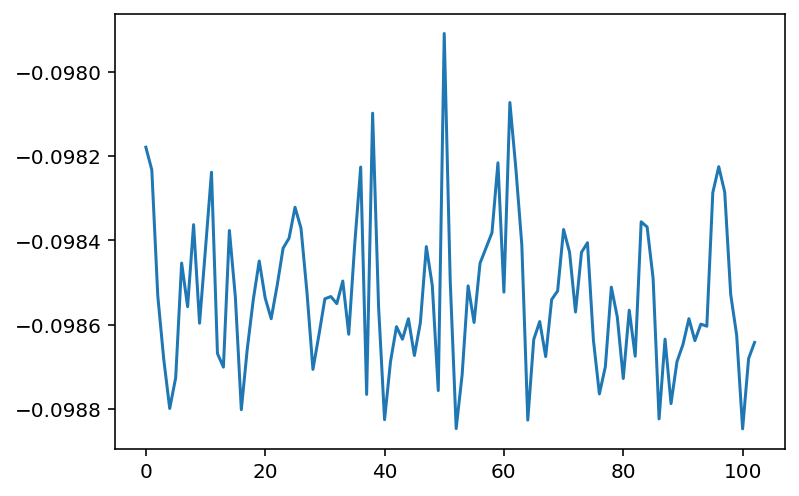

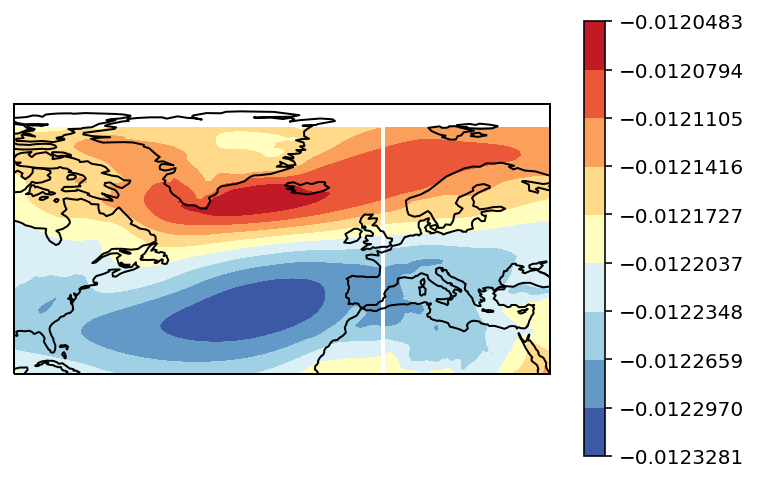

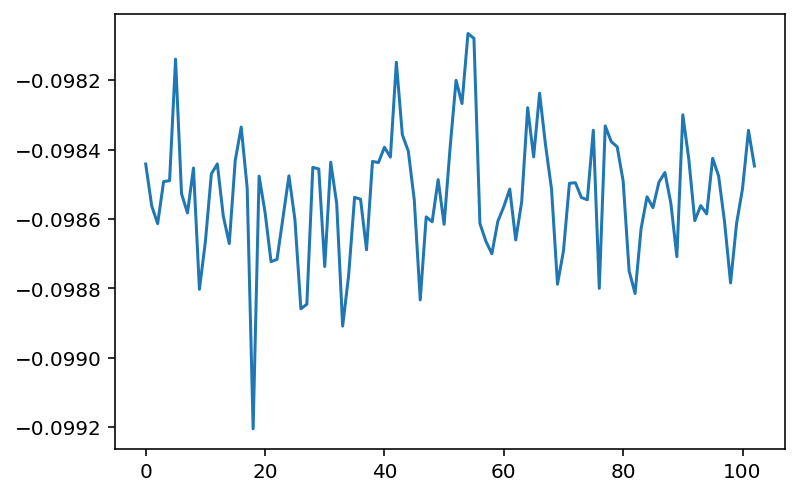

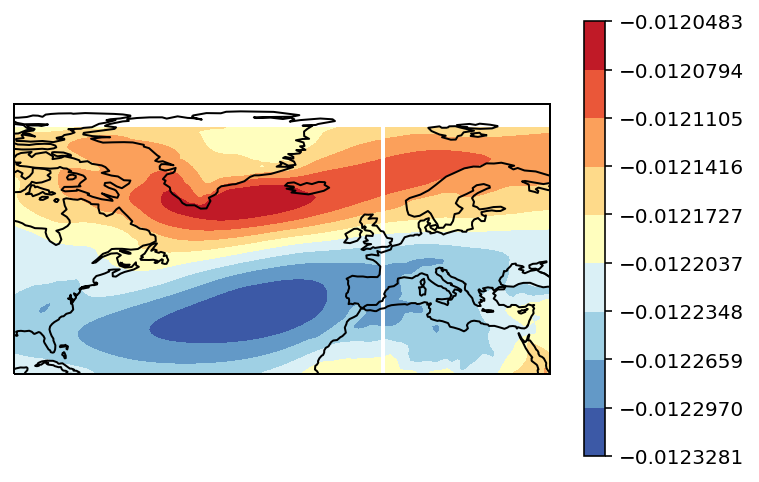

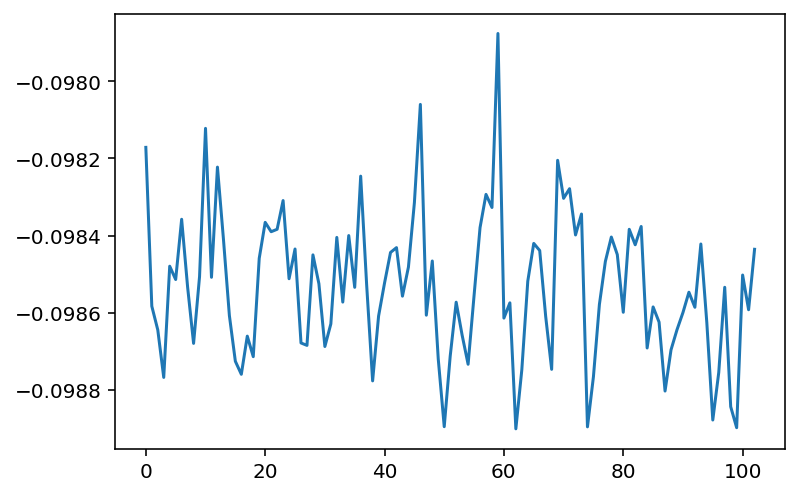

...

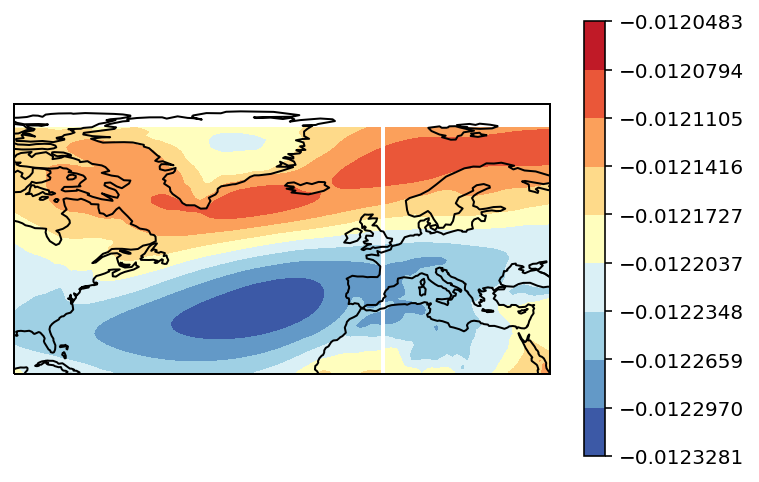

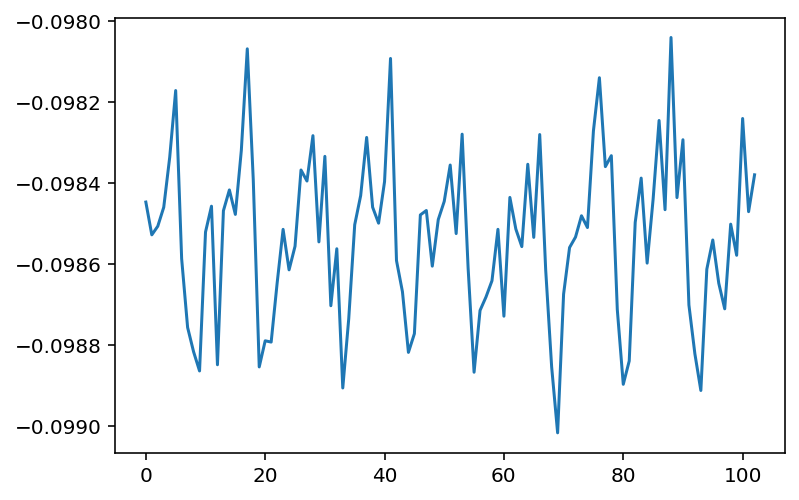

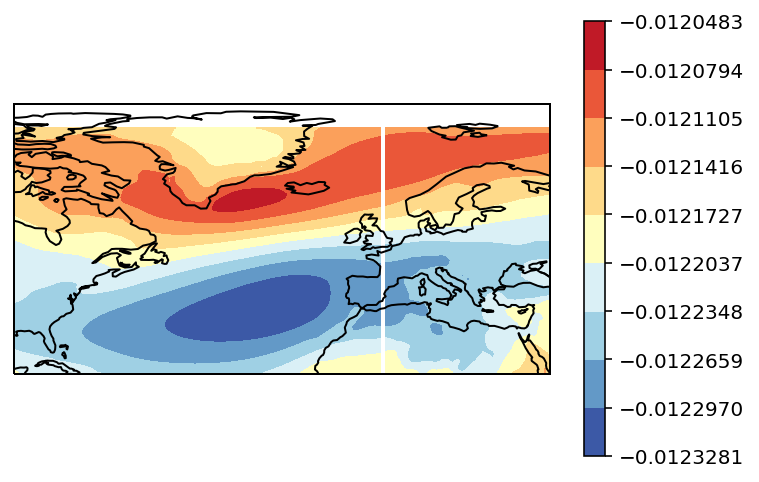

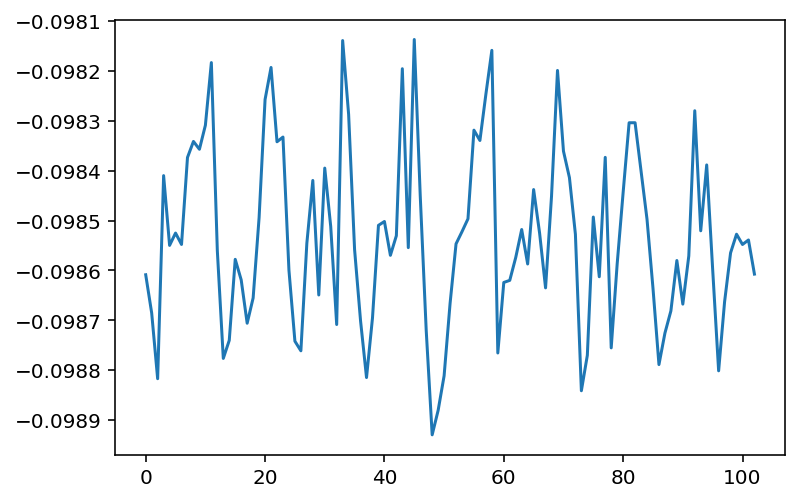

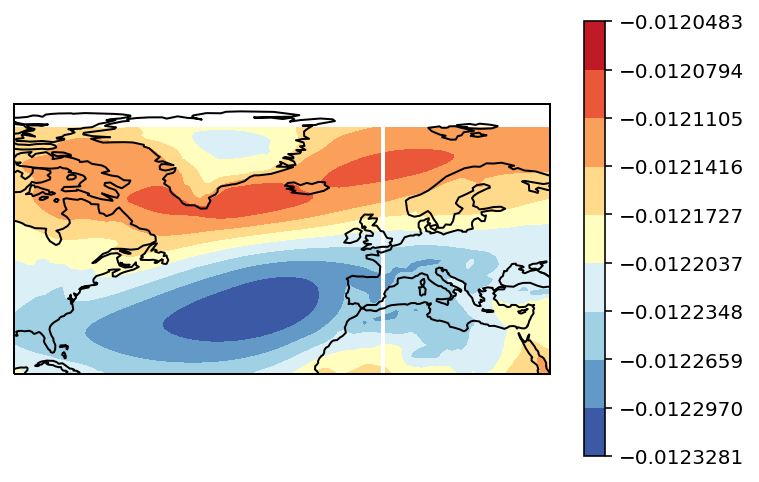

In [ ]:
proj = ccrs.PlateCarree()
cmap1=plt.cm.RdYlBu_r
levels = np.linspace(-0.012328085, -0.0120483255, 10)
# levels1 = np.linspace(-0.02535509, 0.025039343, 10) # Levels for the 2nd singular value

maxes = []
mins = []
for i in range(len(U)):
  maxes.append(max(U[i][:, 1]))
  mins.append(min(U[i][:, 1]))
print(max(maxes))
print(min(mins))
# The kth row of VT is a time series corresponding to the kth singular value/"eigenpattern" in the singular value decomposition
# for i in range(len(VT)):
#   plt.plot(VT[i][0])
#   plt.show()

#I don't think the following is really working, need to do dimensionality reduction somehow
for i in range(len(U)):
  plt.plot(VT[i][0]) #The first index here tells where in the list of VT matrices to go from (i.e. which decade), the second index tells which eigen time series to graph
  plt.show()
  U1 = U[i][:, 0] # Each column of U is a "basis eigenpattern" that represents a direction of variability in the dataset. I'm just looking at the first basis eigenpattern, which is by FAR the most important one (can be demonstrated by plotting the singular values)
  U12d = U1.reshape((64, 105)) # Getting it reshaped so that I can graph it as lat, lon
  ax = plt.axes(projection=proj)
  cs=ax.contourf(lon, lat, U12d,levels,
                transform=proj,
                cmap=cmap1)
  ax.coastlines()
  ax.set_extent([-90, 40, 20, 80]) # longitude latitude extent
  plt.colorbar(cs, orientation='vertical') # color map
  plt.show()

## Dividing up by season
(updated based on the lecture)

In [ ]:
# Accessing the file, getting it to just the lats and lons I want:
zstore = psl_ssp585.zstore.values[0]
mapper = fsspec.get_mapper(zstore)
ds = xr.open_zarr(mapper, consolidated=True, decode_times=True) # Make decode_times=True to convert dates to datetime objects?? The problem is, Colab doesn't seem to like my installation of nc-time-axis. I could try a Jupyter Binder, or keep Googling to try to solve this.
psl = ds.psl.sel(lat=slice(20,80))
psl = psl.where((ds.lon >= 270) | (ds.lon <= 40), drop=True)
lat = ds.lat.sel(lat=slice(20,80))
lon = ds.lon.where((ds.lon >= 270) | (ds.lon <= 40), drop=True) # Not sure exactly what drop means, but I think it doesn't matter


# Useful stackexchange post: https://stackoverflow.com/questions/40272222/select-xarray-pandas-index-based-on-specific-months
def is_djf(month):
  return (month>=12) | ((month>=1) & (month<=2))
def is_mam(month):
  return (month>=3) & (month<=5)
def is_jja(month):
  return (month>=6) & (month<=8)
def is_son(month):
  return (month>=9) & (month<=11)
psl_djf = psl.sel(time=is_djf(psl['time.month']))
psl_mam = psl.sel(time=is_mam(psl['time.month']))
psl_jja = psl.sel(time=is_jja(psl['time.month']))
psl_son = psl.sel(time=is_son(psl['time.month']))


psl_allseasons = {
    'DJF': psl_djf,
    'MAM': psl_mam,
    'JJA': psl_jja,
    'SON': psl_son
}
# Splitting it up by decade:
decades = np.arange(2010, 2110, 10)
decade_list = [] # I'll use decade_list for graphing.
for i in range(len(decades)):
  if i<(len(decades)-1):
    decade_list.append(str(decades[i])+'-'+str(decades[i+1]))
decade_list[0] = '2015-2020'

def in_decade(minyear, maxyear, year):
  return (year>=minyear) & (year<maxyear)
psl_FINAL = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
for j in psl_allseasons.keys():
  for i in range(1, len(decades)):
    psl_FINAL[j].append(psl_allseasons[j].sel(time=in_decade(decades[i-1], decades[i], psl_allseasons[j]['time.year'])))

# I need to weight the data by the square root of the cosine of latitude. Right now I think it's working
psl_WEIGHTED = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
weights = np.sqrt(np.cos(np.radians(psl_FINAL['JJA'][0].lat))) # Latitudes are the same for all of the sub-datasets, so I can define the weights according to latitude based on a randomly chosen sub-dataset outside of the for loop to save time
for season in psl_FINAL.keys():
  for i in range(len(psl_FINAL[season])): # Need to do this for each decade within the seasonal dictionary entries
    tlength = len(psl_FINAL[season][i].time) # Need to have the correct time length in order to make the arrays below.
    psl_weighted = np.ones((tlength, 64, 105)) # This will be filled up with the weighted latitudes.
    loaded_psl = psl_FINAL[season][i].values #Loading the data before the for loop drastically speeds up the program
    for j in range(64):
      psl_weighted[:, j, :] = loaded_psl[:, j, :]*float(weights[j])
    psl_WEIGHTED[season].append(psl_weighted)

Udict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
sdict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
VTdict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
Sigmadict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
estimatedict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}

for key in psl_FINAL.keys():
  for i in range(9):
    print(i)
    tlength = len(psl_FINAL[key][i].time) # The psl_WEIGHTED dictionary does not contain DataArray objects, so I can't just get the time from that.
    psl2d = np.reshape(psl_WEIGHTED[key][i], (tlength, 6720)) # This is the only line in the for loop I changed when adding in the weighting
    psl2d = np.matrix.transpose(psl2d)
    Unow, snow, VTnow = LA.svd(psl2d, full_matrices=False)
    Sigmanow = np.diag(snow)
    estimatenow = Unow[:, :1] @ Sigmanow[0:1, :1] @ VTnow[:1, :]
    estimatenow = np.matrix.transpose(estimatenow) #Doing this so that I can later reshape the approximation matrix to have dimensionality (time, lat, lon), for consistency since this is how the climate NetCDF files are typically structured.
    Udict[key].append(Unow)
    sdict[key].append(snow)
    VTdict[key].append(VTnow)
    estimatedict[key].append(estimatenow)

0
1
2
3
4
5
6
7
8
0
1
2
3
4
5
6
7
8
0
1
2
3
4
5
6
7
8
0
1
2
3
4
5
6
7
8


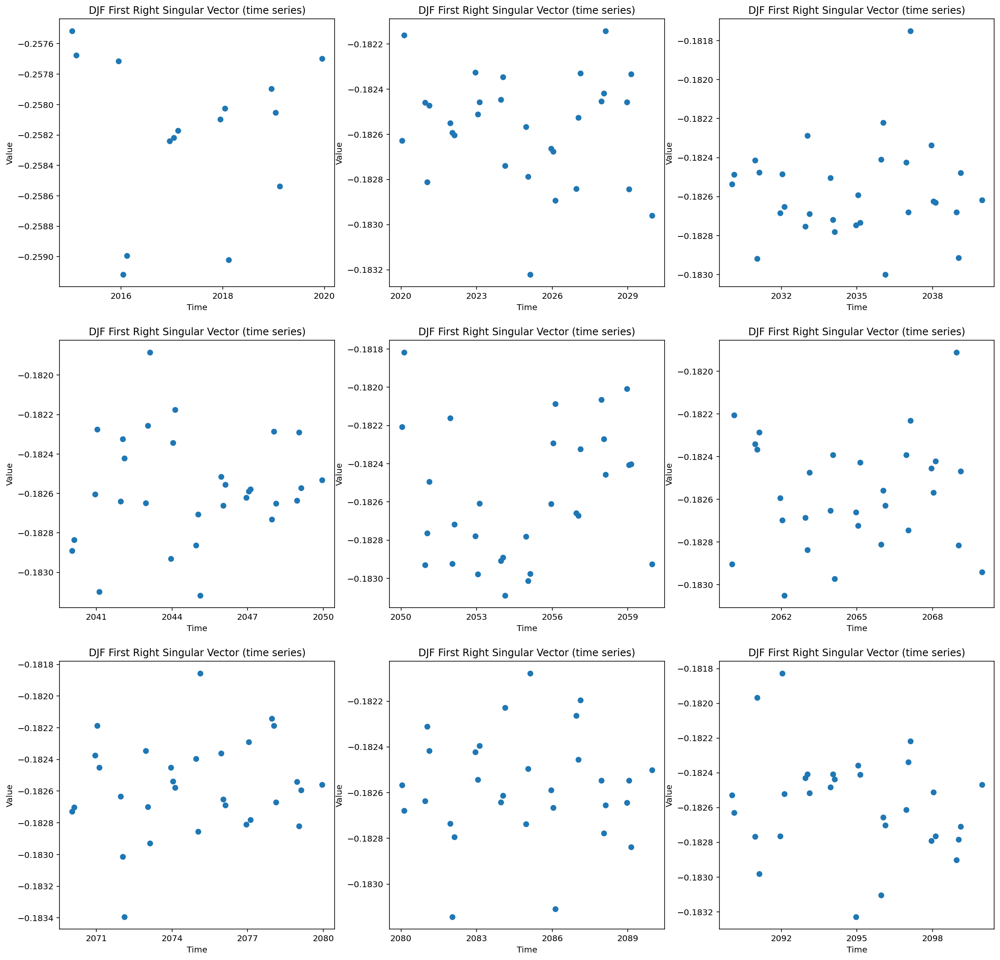

/usr/lib/python3/dist-packages/cartopy/io/__init__.py:264: DownloadWarning: Downloading: http://naciscdn.org/naturalearth/110m/physical/ne_110m_coastline.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


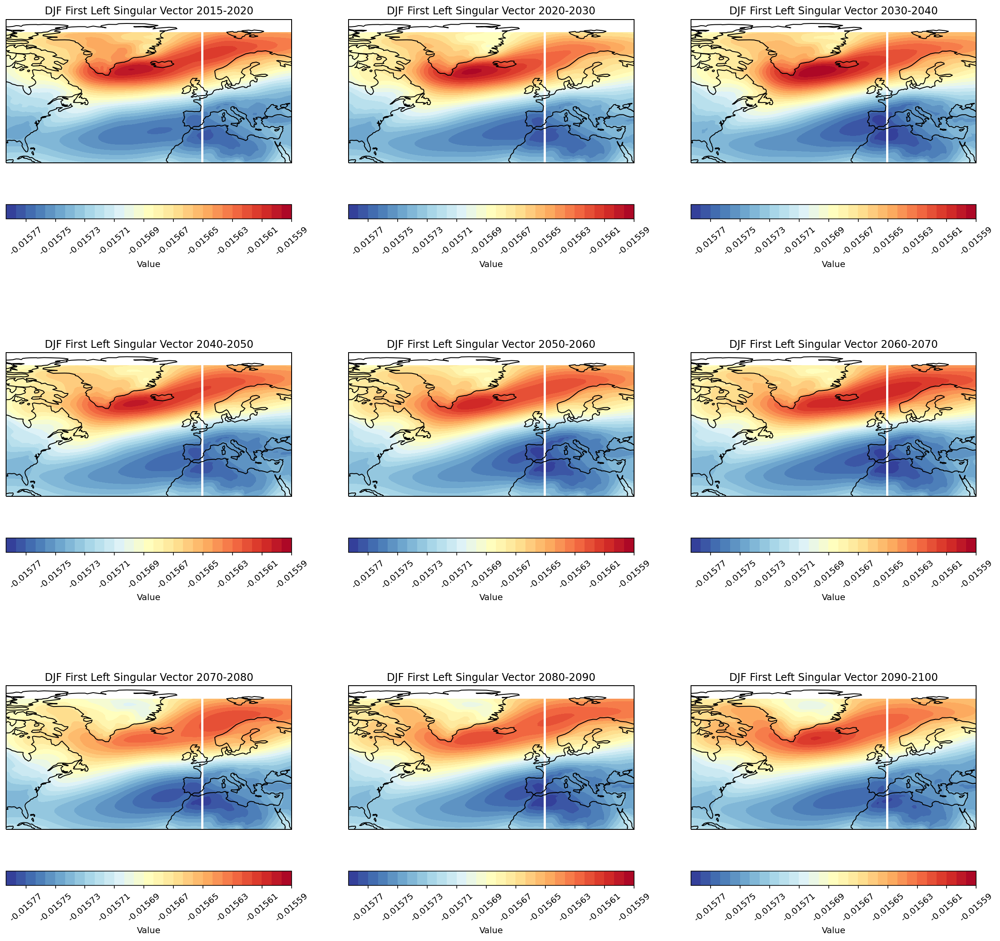

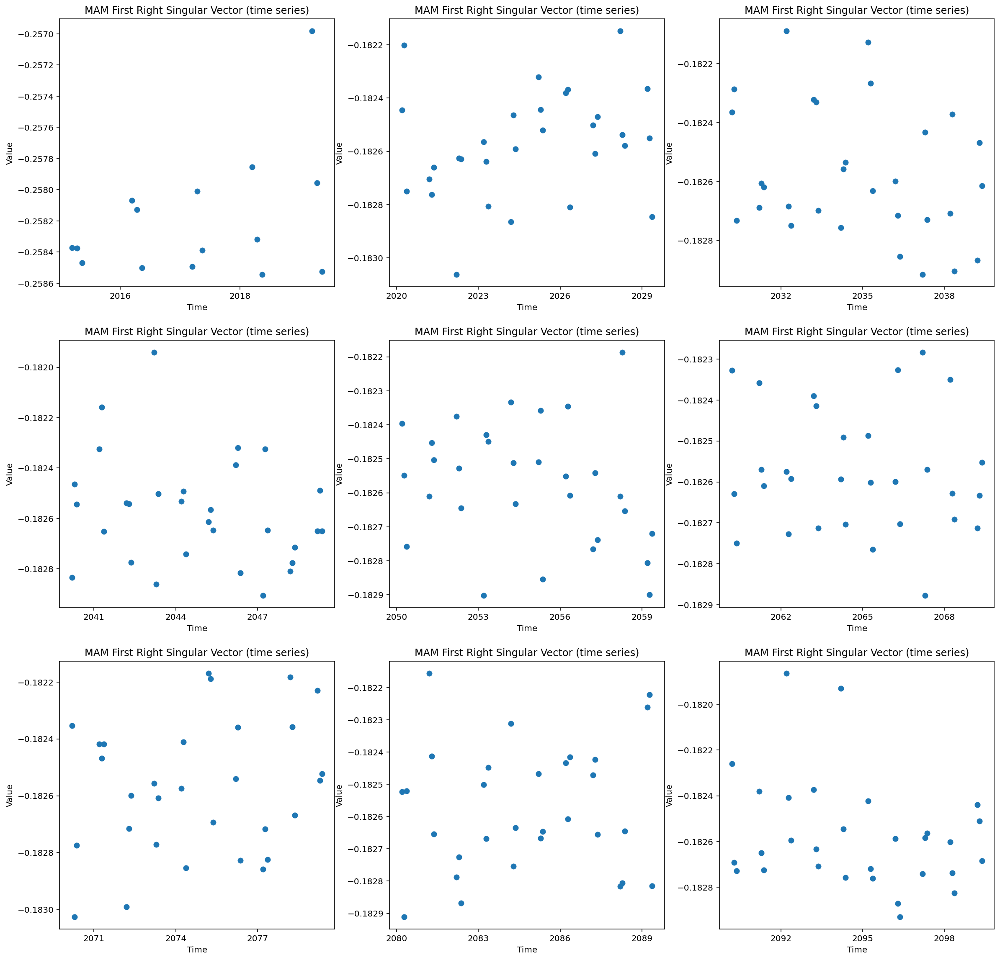

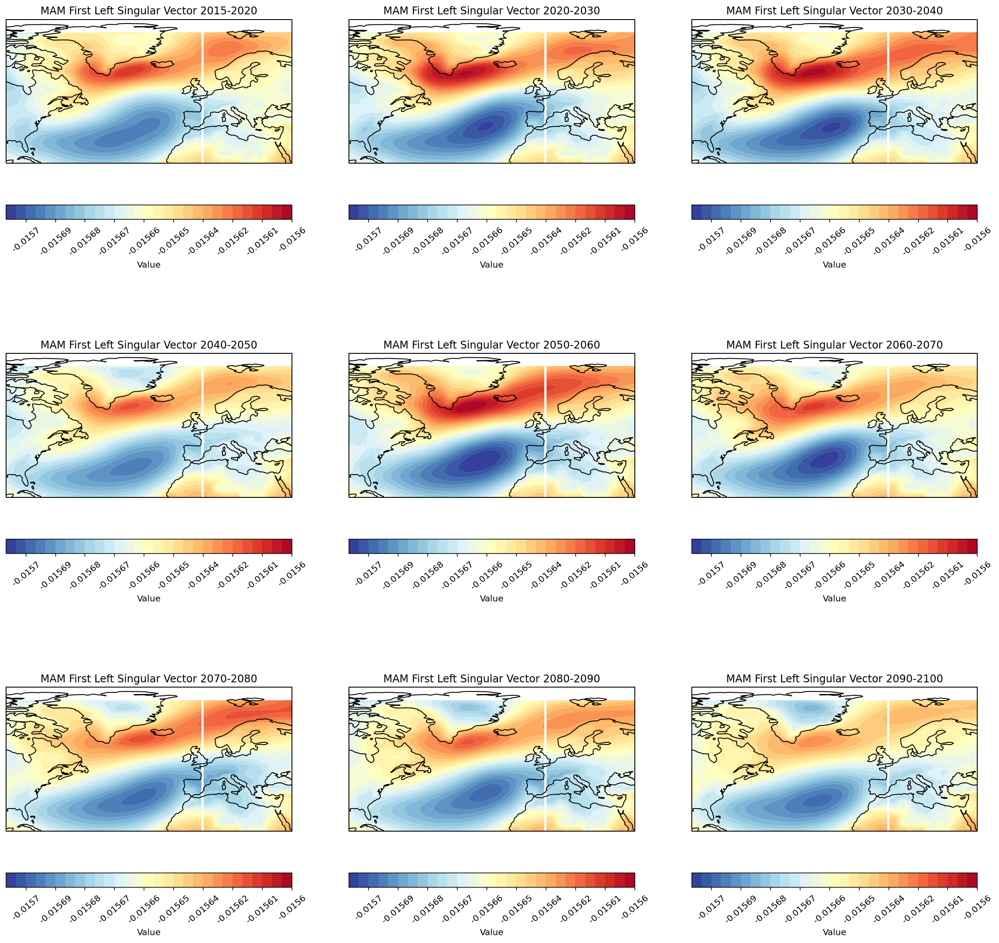

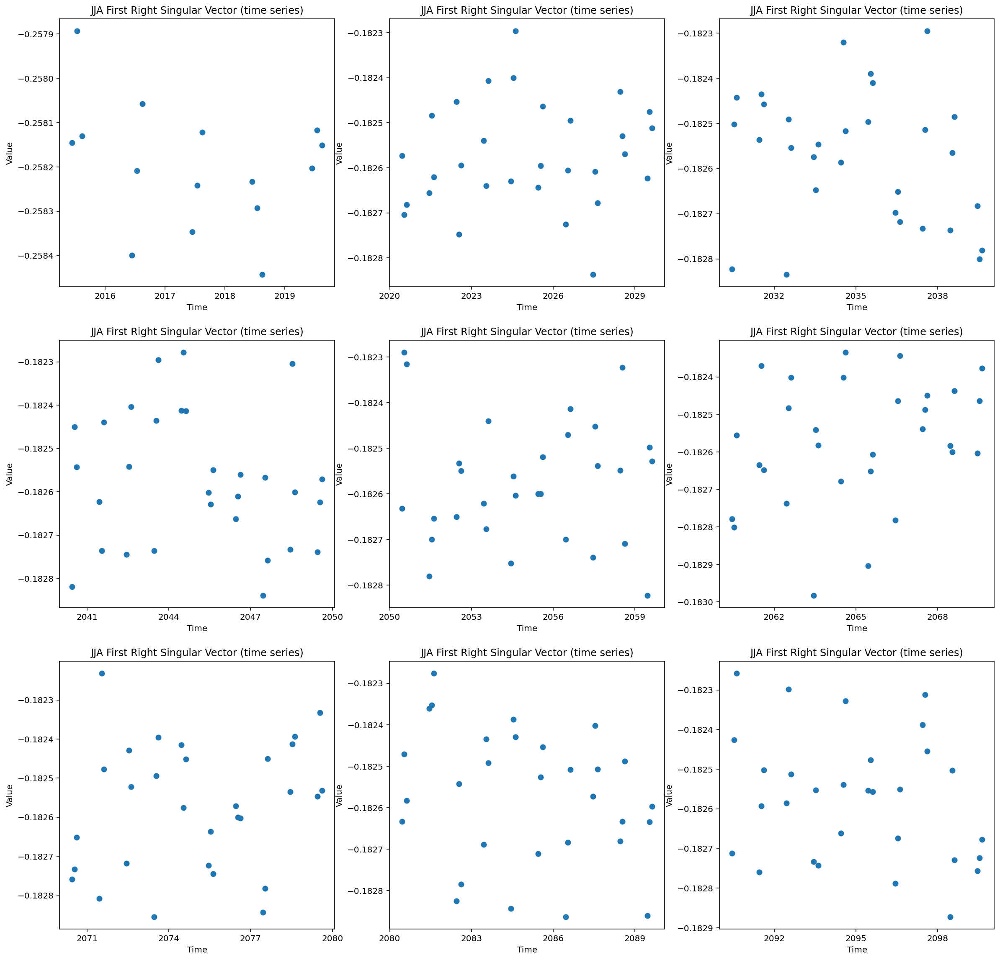

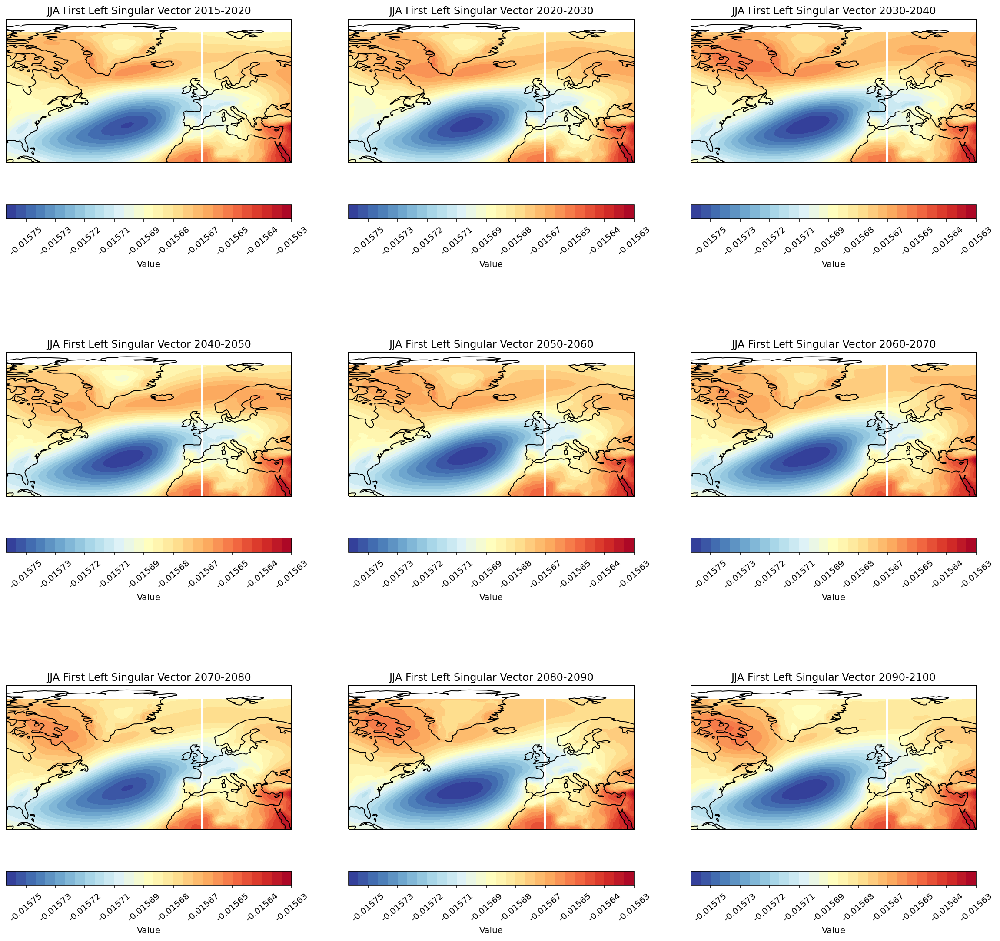

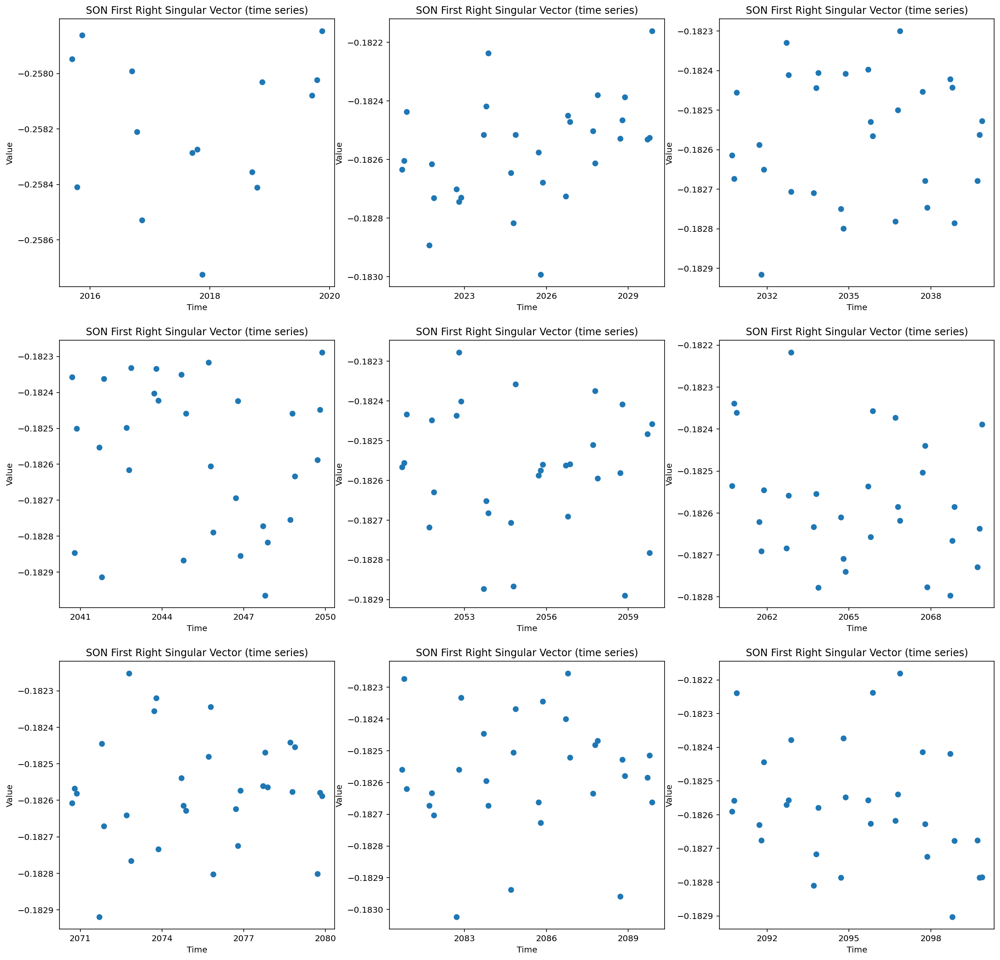

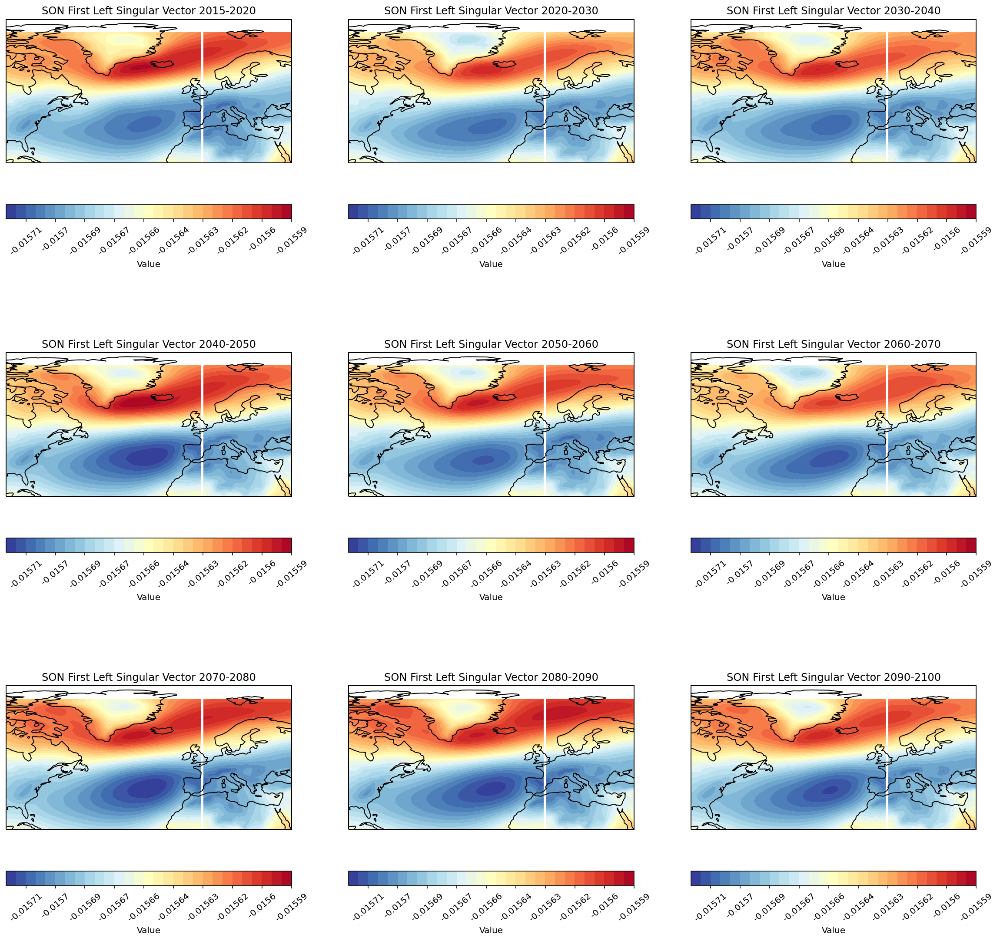

In [ ]:
def svectors(season):
  # global U12d
  # maxes = []
  # mins = []
  # for i in range(len(Udict[season])):
  #   print(Udict[season][i][:, 0].shape)
  #   to_maxmin = Udict[season][i][:, 0] # Each column of U is a "basis eigenpattern" that represents a direction of variability in the dataset. I'm just looking at the first basis eigenpattern, which is by FAR the most important one (can be demonstrated by plotting the singular values)
  #   maxes.append(max(to_maxmin))
  #   mins.append(min(to_maxmin))
  # minimum = min(mins)
  # maximum = max(maxes)
  # print(minimum, maximum)
  mins = []
  maxes = []
  for i in range(len(Udict[season])):
    U1 = Udict[season][i][:, 0]
    U12d = U1.reshape((64, 105))
    U12d=np.matmul(np.diag(weights**-1), U12d)
    for j in U12d:
      mins.append(min(j))
      maxes.append(max(j))
  # print(min(mins), max(maxes))
  minimum = min(mins)
  maximum=max(maxes)
  
  cmap1=plt.cm.RdYlBu_r
  levels = np.linspace(minimum, maximum, 30)
  # levels = np.linspace(-0.015700901684942033, -0.015352819022413573, 10)
  fig = plt.figure()
  fig.set_figheight(20)
  fig.set_figwidth(20)
  for i in range(9):
    ax1 = fig.add_subplot(3, 3, i+1)
    ax1.plot(psl_FINAL[season][i].time, VTdict[season][i][0], 'o') #The first index here tells where in the list of VT matrices to go from (i.e. which decade), the second index tells which eigen time series to graph
    ax1.set_title(season+' First Right Singular Vector (time series)')
    ax1.set_ylabel('Value')
    ax1.set_xlabel('Time')
  plt.show()
  fig2, axarr = plt.subplots(nrows=3, ncols=3, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
  axlist = axarr.flatten() # Helpful code: https://unidata.github.io/MetPy/latest/examples/Four_Panel_Map.html
  for i in range(9):
    U1 = Udict[season][i][:, 0] # Each column of U is a "basis eigenpattern" that represents a direction of variability in the dataset. I'm just looking at the first basis eigenpattern, which is by FAR the most important one (can be demonstrated by plotting the singular values)
    U12d = U1.reshape((64, 105)) # Getting it reshaped so that I can graph it as lat, lon
    U12d=np.matmul(np.diag(weights**-1), U12d)
    cs=axlist[i].contourf(lon, lat, U12d,levels,
                  transform=ccrs.PlateCarree(),
                  cmap=cmap1)
    axlist[i].coastlines()
    axlist[i].set_extent([-90, 40, 20, 80]) # longitude latitude extent
    cbar = fig.colorbar(cs, ax=axlist[i], orientation='horizontal') # color map
    cbar.ax.set_xticklabels([round(i, 5) for i in levels], rotation=40)
    cbar.set_label('Value')
    axlist[i].set_title(season+' First Left Singular Vector '+decade_list[i])
  plt.show()
for key in psl_FINAL.keys():
  svectors(key)

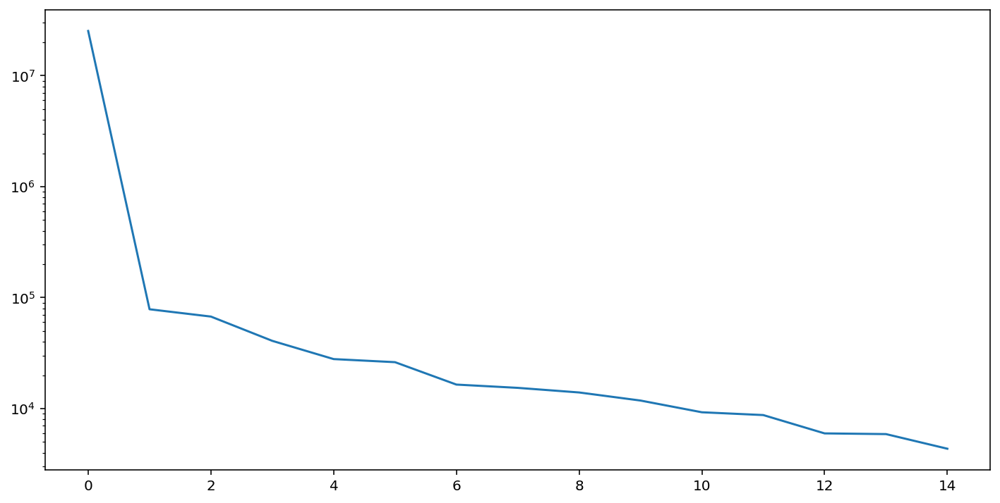

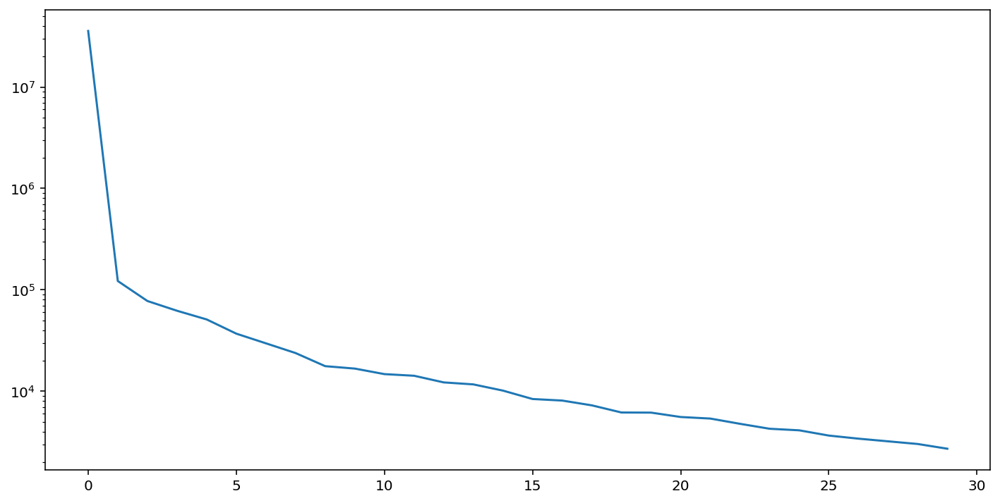

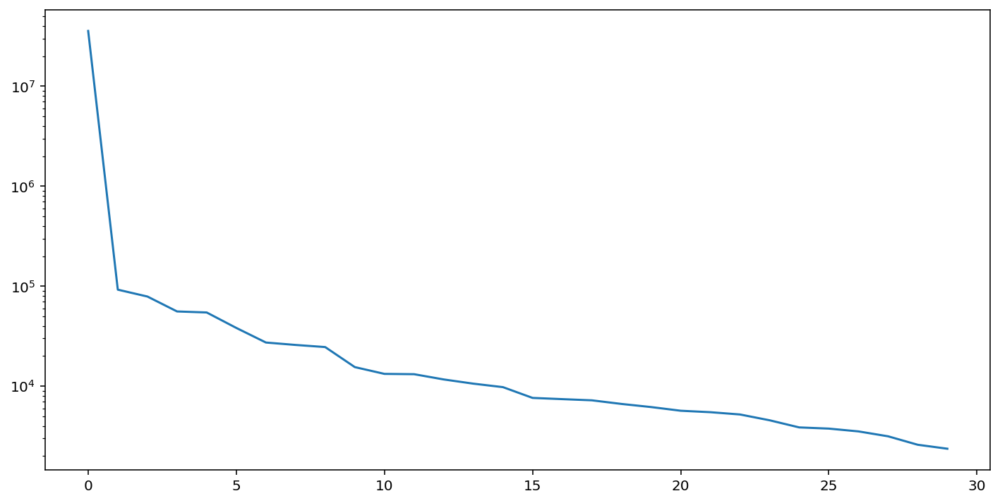

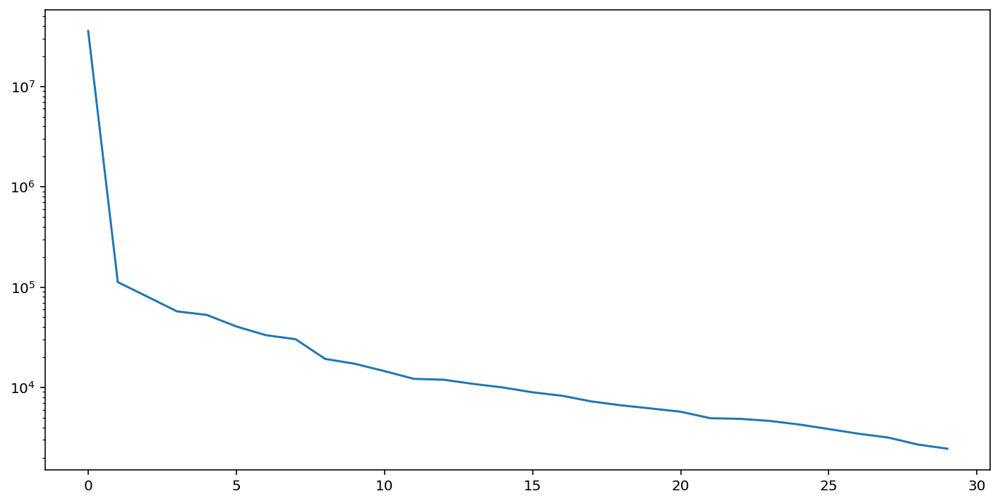

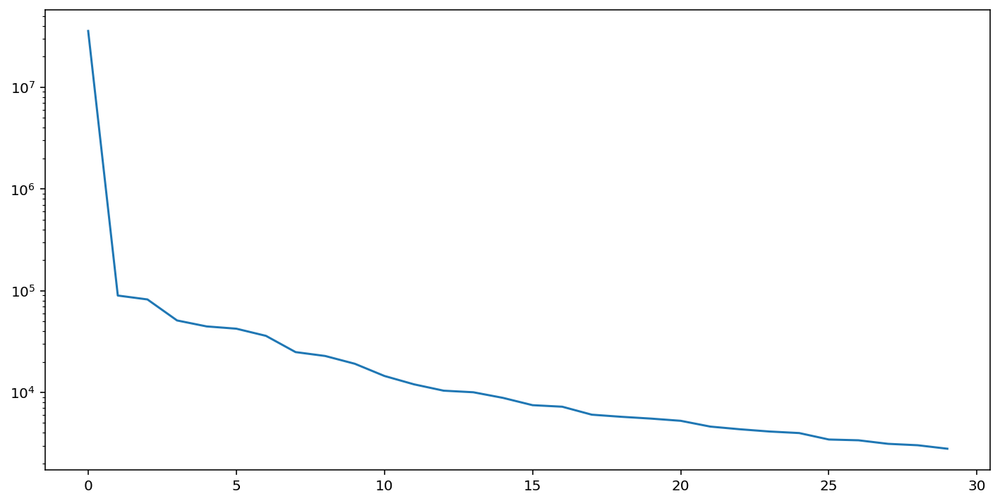

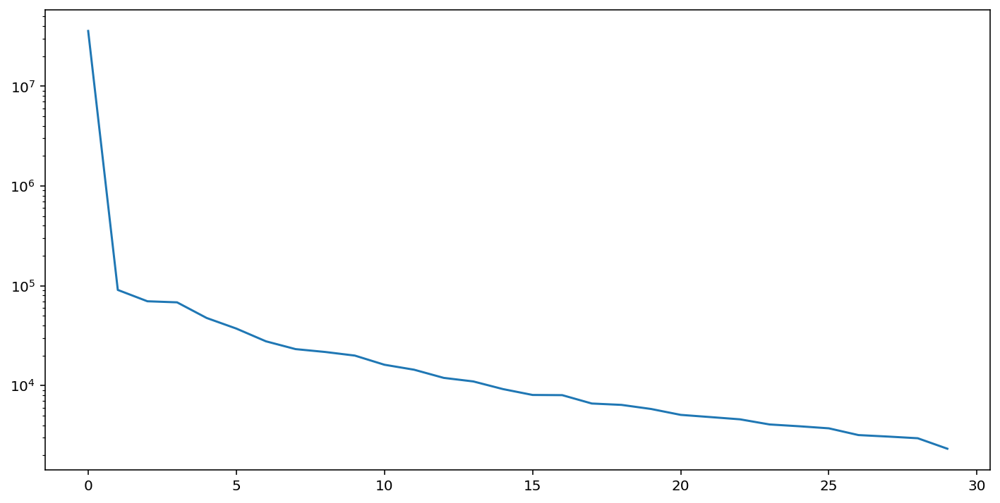

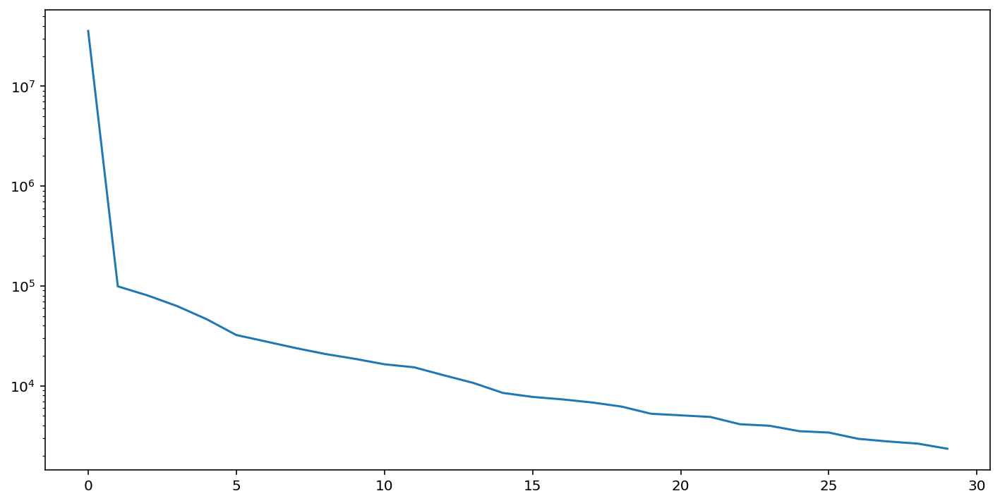

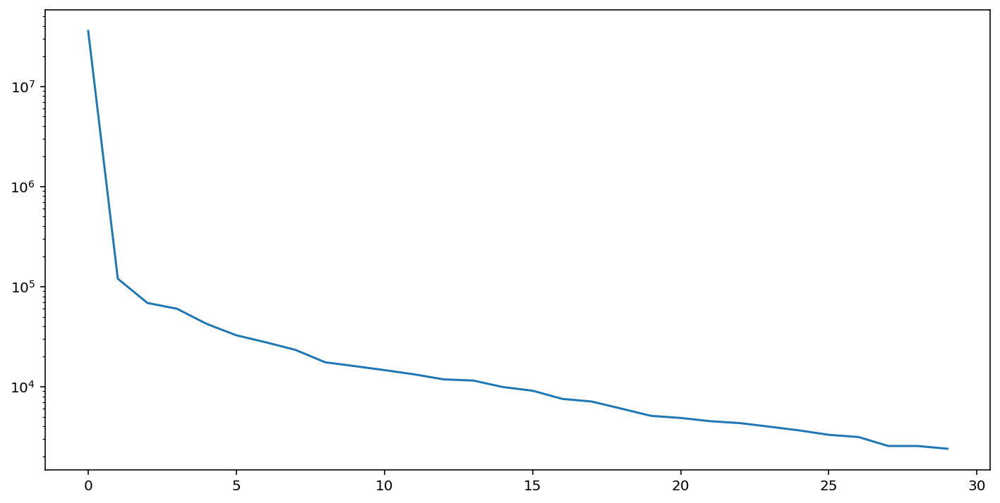

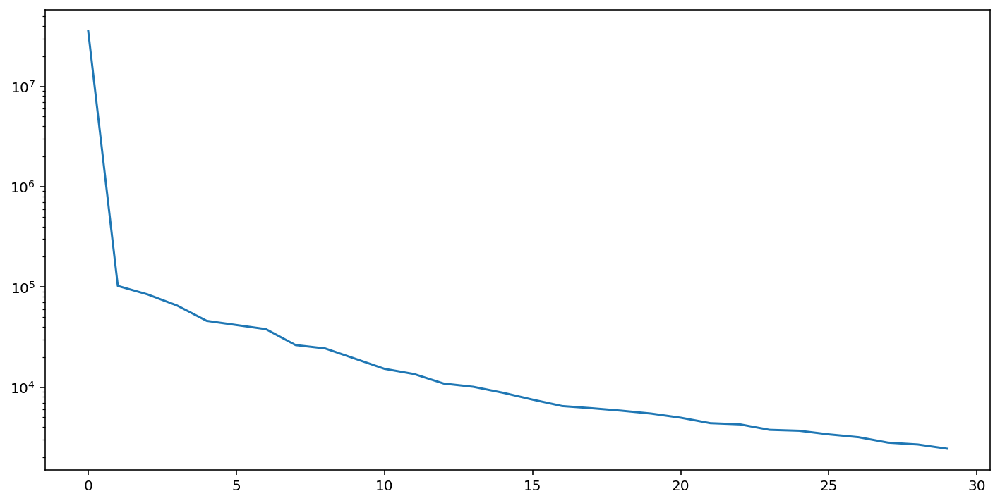

In [ ]:
for i in sdict['DJF']:
  plt.semilogy(i)
  plt.show()

In [ ]:
# U12d
# print(weights)
# print(np.diag(weights))
# print(weights**-1)
# print(weights*weights**-1)
# plt.pcolormesh(U12d)
for season in psl_FINAL.keys():
  mins = []
  maxes = []
  for i in range(len(Udict[season])):
    U1 = Udict[season][i][:, 0]
    U12d = U1.reshape((64, 105))
    U12d=np.matmul(np.diag(weights**-1), U12d)
    for j in U12d:
      mins.append(min(j))
      maxes.append(max(j))
  print(min(mins), max(maxes))

# for i in np.matmul(np.diag(weights**-1), U12d):
#   print(i)
#   mins.append(min(i))
#   maxes.append(max(i))
# print(min(mins), max(maxes))

-0.015768677747051596 -0.015184564456225322
-0.015701396945449458 -0.015380614651068956
-0.01574610739436047 -0.015367679882934672
-0.01571219715882317 -0.01531923652592033


**Plotting the last graph subtracted from each other decade:**

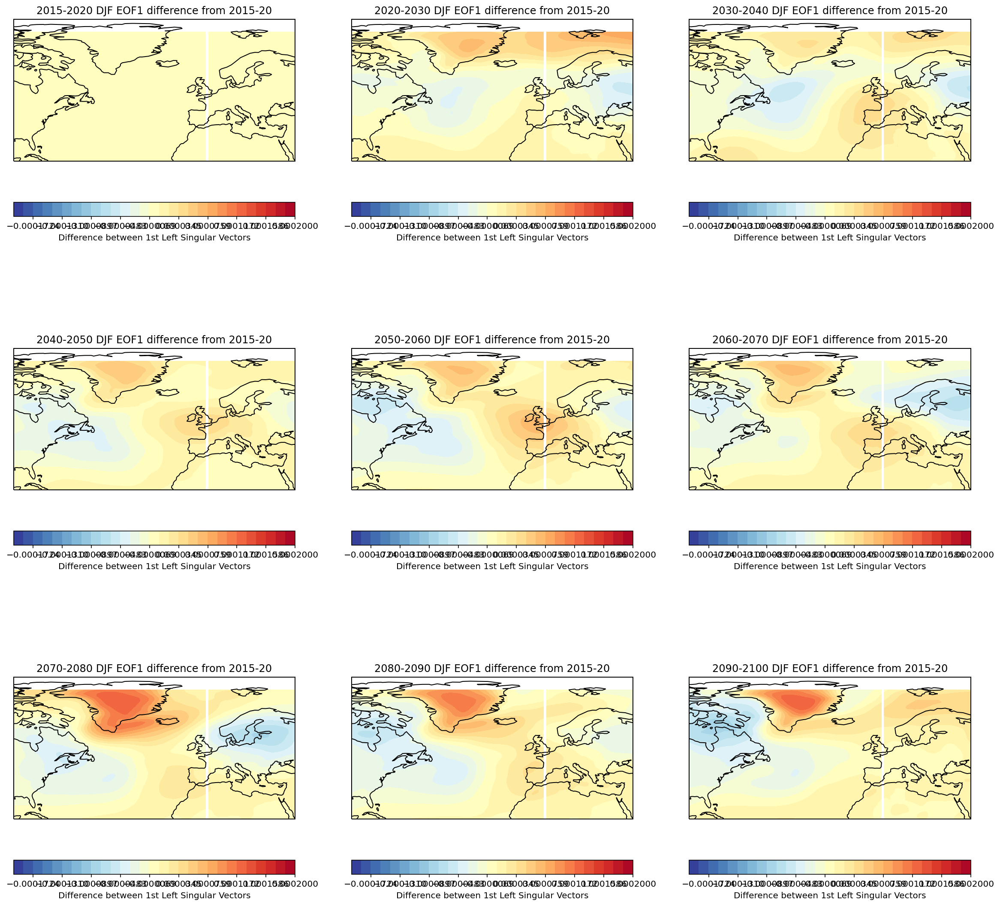

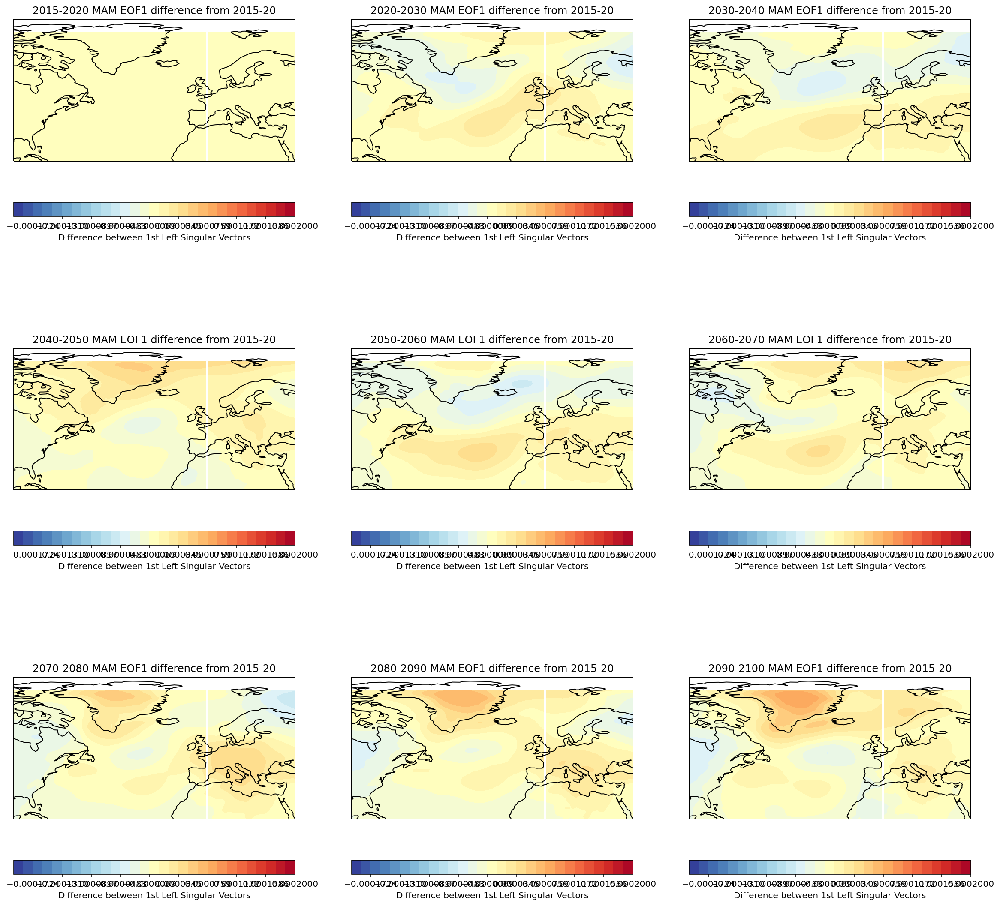

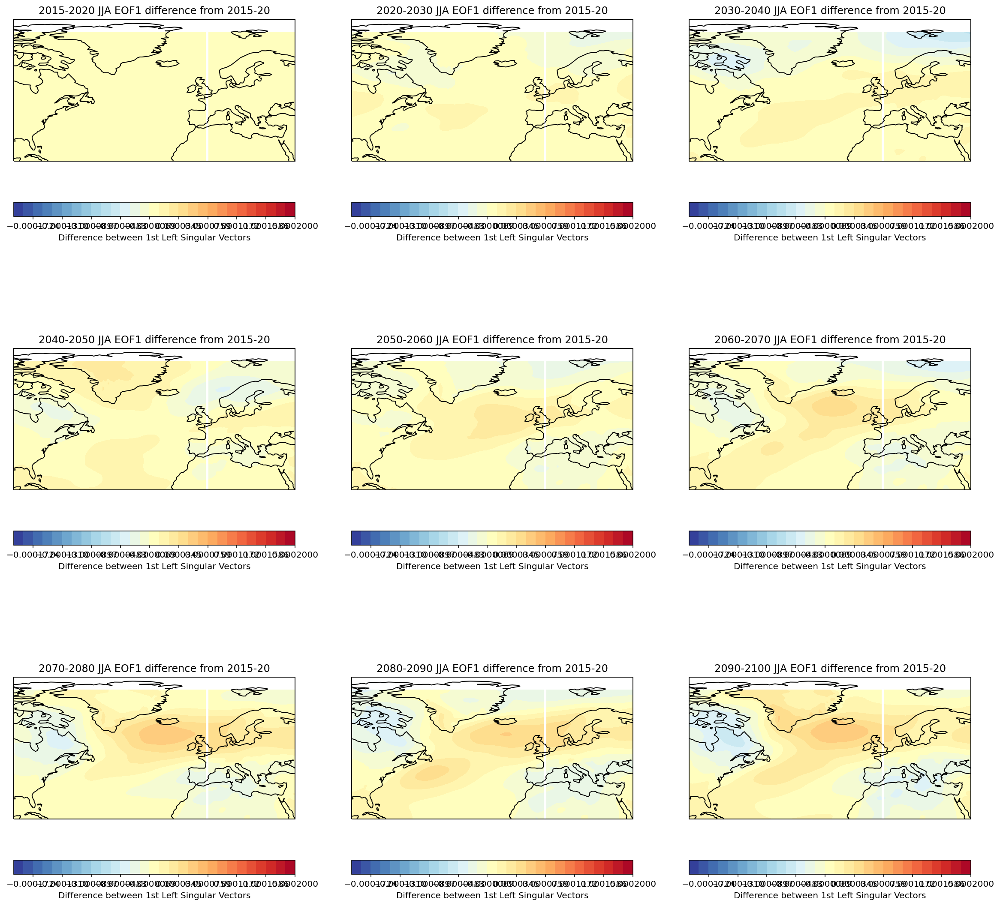

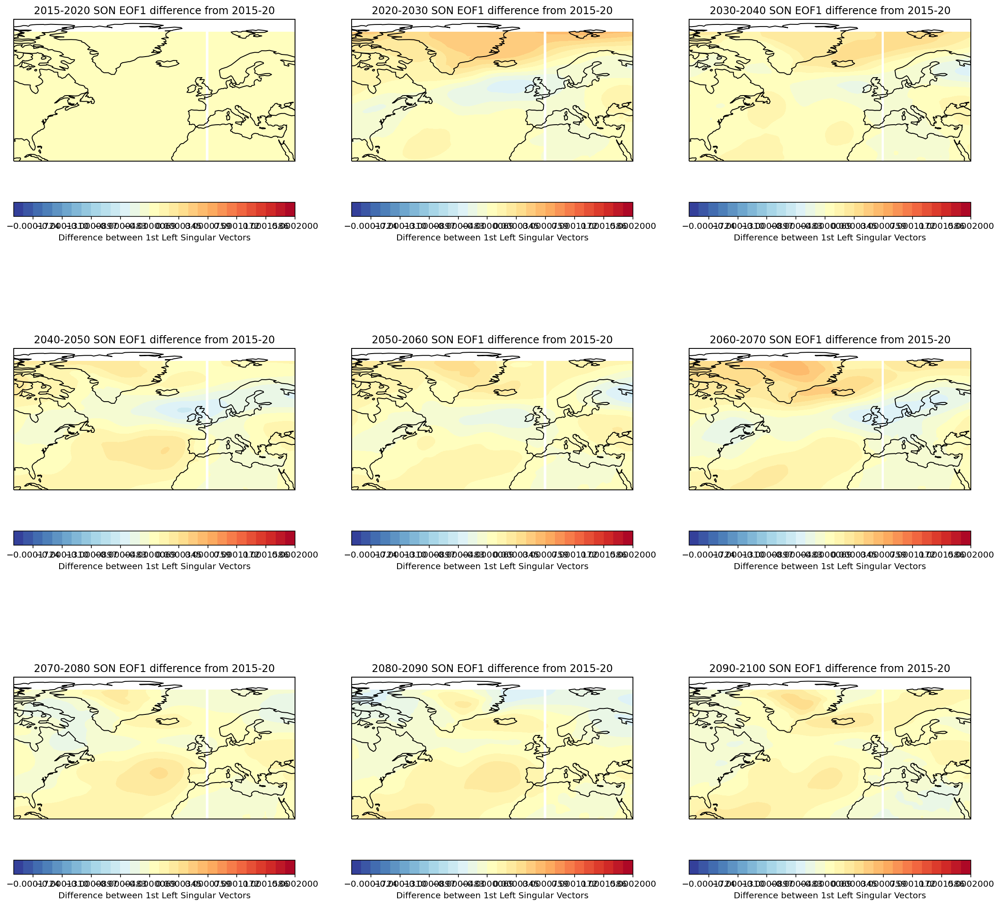

In [ ]:
def changes(season):
  Ustart = Udict[season][0][:,  0]
  Ustart2d = Ustart.reshape((64, 105))
  Ustart2d=np.matmul(np.diag(weights**-1), Ustart2d)
  # diffLevels = np.linspace(-4.7268346e-05, 4.6583824e-05, 10)
  diffLevels=np.linspace(-2e-4, 2e-4, 30)
  fig, axarr = plt.subplots(nrows=3, ncols=3, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
  axlist = axarr.flatten()
  cmap1=plt.cm.RdYlBu_r
  for i in range(len(Udict[season])):
    U1 = Udict[season][i][:, 0] # Each column of U is a "basis eigenpattern" that represents a direction of variability in the dataset. I'm just looking at the first basis eigenpattern, which is by FAR the most important one (can be demonstrated by plotting the singular values)
    U12d = U1.reshape((64, 105)) # Getting it reshaped so that I can graph it as lat, lon
    U12d=np.matmul(np.diag(weights**-1), U12d)
    cs=axlist[i].contourf(lon, lat, Ustart2d-U12d,diffLevels,
                  transform=ccrs.PlateCarree(),
                  cmap=cmap1)
    axlist[i].coastlines()
    axlist[i].set_extent([-90, 40, 20, 80]) # longitude latitude extent
    cbar = fig.colorbar(cs, ax=axlist[i], orientation='horizontal') # color map
    cbar.set_label('Difference between 1st Left Singular Vectors')
    axlist[i].set_title(decade_list[i]+' '+season+' EOF1 difference from 2015-20')
  plt.show()
for key in psl_FINAL.keys():
  changes(key)

###Trying to plot the Principal Components: based on [this article](https://www.cs.cmu.edu/~tom/10701_sp11/slides/pca_wall.pdf), I think the PCs are simply the entries of US.

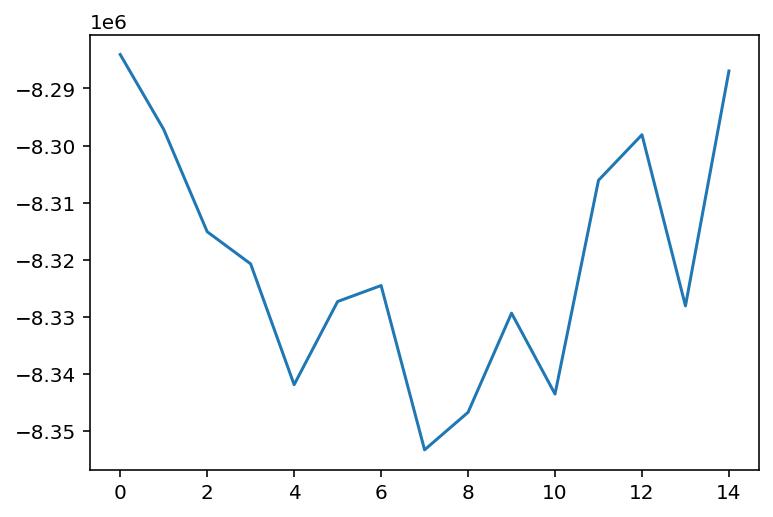

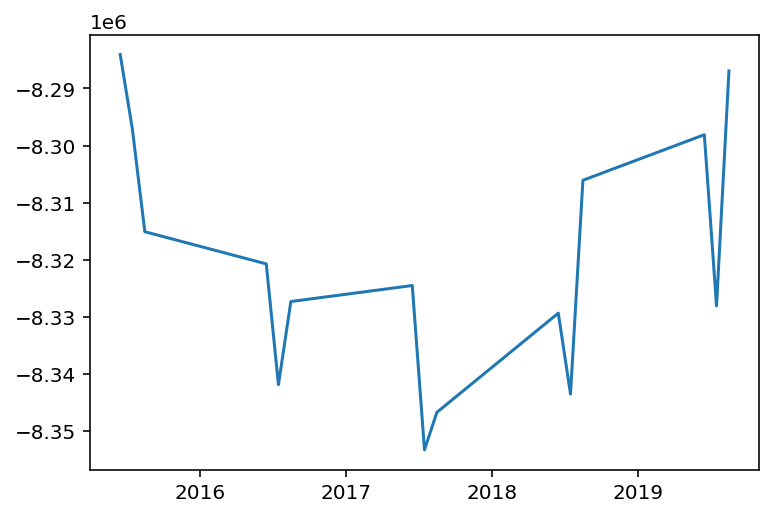

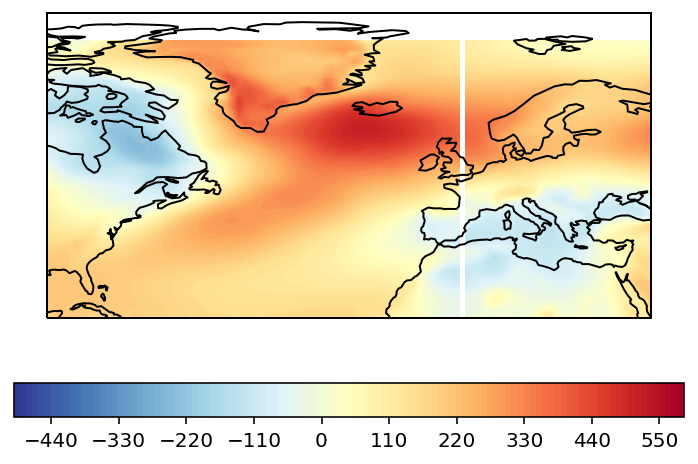

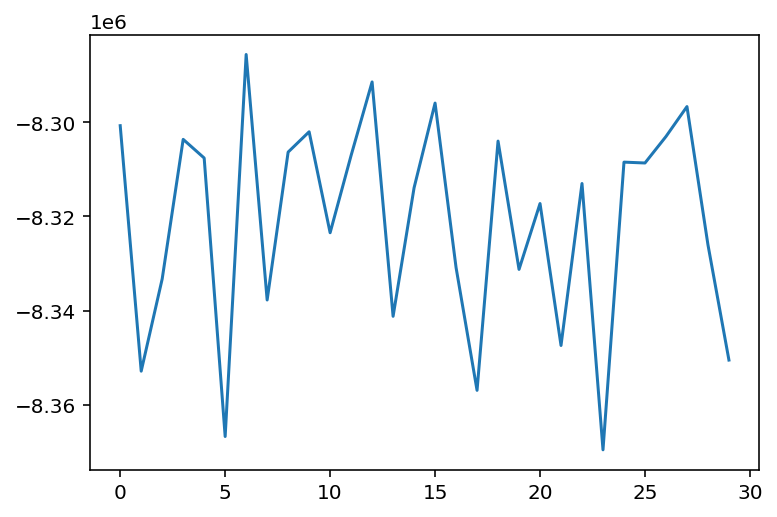

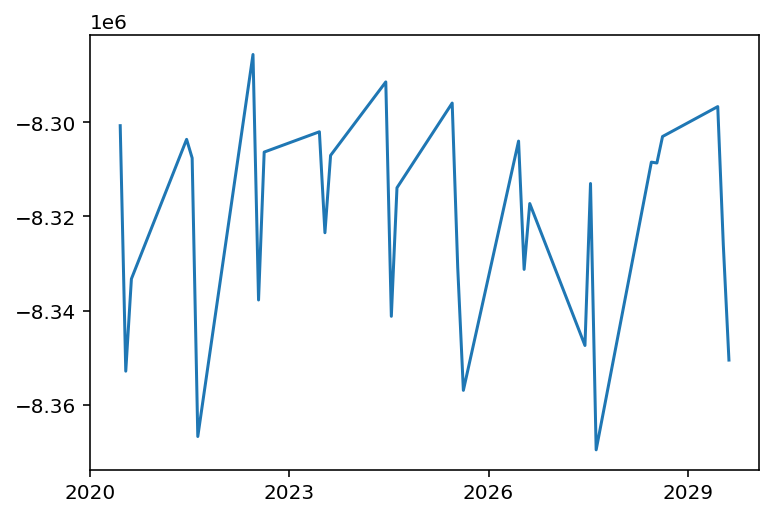

...

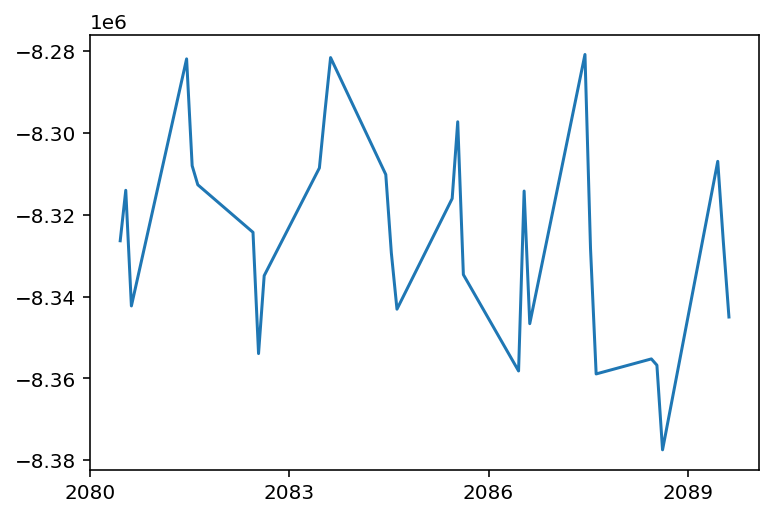

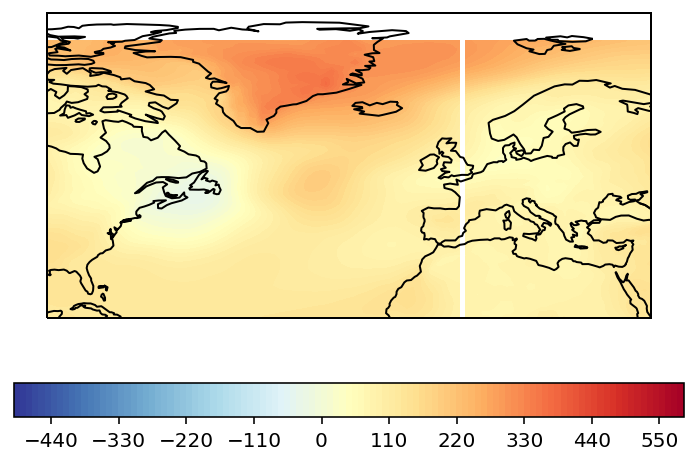

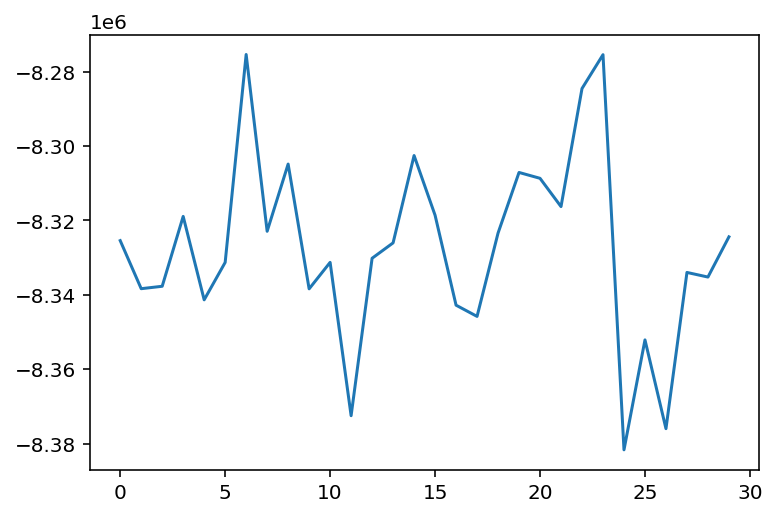

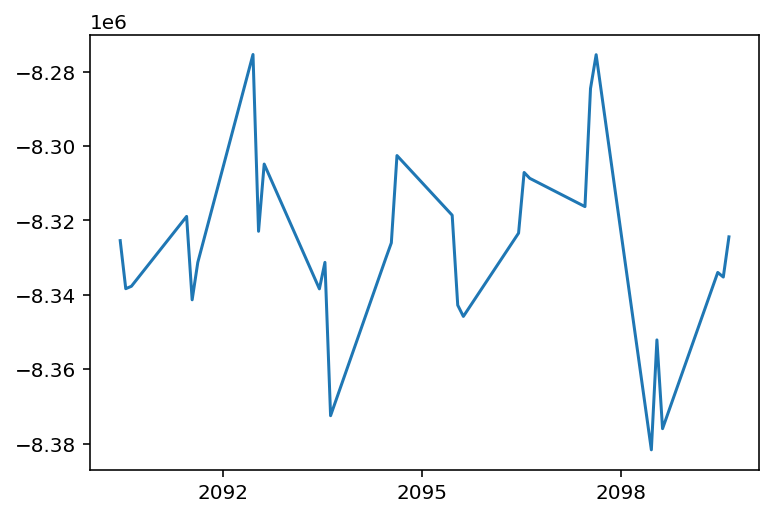

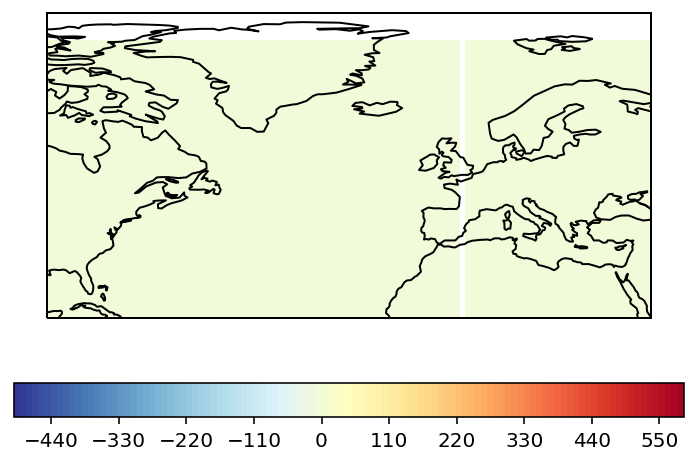

In [ ]:
estfinal = estimate[-1].reshape((30, 64, 105))
levels2 = np.arange(-500, 600, 10)
for i in range(len(estimate)):
  tlength = len(estimate[i][:, 0])
  plt.plot(U[i] @ s[i])
  plt.show()
  plt.plot(psl_jja_list[i].time, U[i]@s[i])
  plt.show()
  est3d = estimate[i].reshape((tlength, 64, 105))
  ax = plt.axes(projection=proj)
  cs=ax.contourf(lon, lat, estfinal[0,:,:] - est3d[0,:,:],levels2,
                transform=proj,
                cmap=cmap1)
  ax.coastlines()
  ax.set_extent([-90, 40, 20, 80]) # longitude latitude extent
  plt.colorbar(cs, orientation='horizontal') # color map
  plt.show()